### Apellidos y Nombres:

Lettere Dragosavljevich Mathias Giuseppe

### Fecha:

24-10-2023

# **Preprocesamiento de datos con Pyspark**


## Google Colab Setup

If you are going to use Google Colab instead of a Spark Cluster, you will need to run the following code to install Apache Spark.

In [1]:
!apt-get install openjdk-8-jdk-headless -qq > /dev/null

In [2]:
#If the following links don't work, you will have to update them with the last versions of Apache Spark
!wget -q https://dlcdn.apache.org/spark/spark-3.4.1/spark-3.4.1-bin-hadoop3.tgz
!tar xf spark-3.4.1-bin-hadoop3.tgz

In [3]:
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
os.environ["SPARK_HOME"] = "/content/spark-3.4.1-bin-hadoop3"

## Setup


In [4]:
# Installing required packages
!pip install pyspark
!pip install findspark

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 316.9/316.9 MB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.5.0-py2.py3-none-any.whl size=317425344 sha256=c94f6c0de1718483ae9ae6dcceb4c28c2af2b42c3cc924a3b83b7442701b23dc
  Stored in directory: /root/.cache/pip/wheels/41/4e/10/c2cf2467f71c678cfc8a6b9ac9241e5e44a01940da8fbb17fc
Successfully built pyspark


In [5]:
import findspark
findspark.init()

In [6]:
from pyspark import SparkContext, SparkConf
from pyspark.sql import SparkSession

#### Creating the spark session and context


In [7]:
# Creating a spark context class
sc = SparkContext()

# Creating a spark session
spark = SparkSession \
    .builder \
    .appName("Python Spark DataFrames basic example") \
    .config("spark.some.config.option", "some-value") \
    .getOrCreate()

#### Initialize Spark session



In [8]:
spark

## Exercise 2 - Load the data and Spark dataframe


## Load the dataset into your Colab directory from your local system


In [9]:
from google.colab import files
files.upload()

Saving sample_minute_weather_processed.csv to sample_minute_weather_processed.csv


{'sample_minute_weather_processed.csv': b'air_pressure,air_temp,avg_wind_direction,avg_wind_speed,max_wind_direction,max_wind_speed,min_wind_direction,min_wind_speed,relative_humidity\r\n915.0,80.24,211.0,1.5,231.0,2.0,196.0,1.1,41.8\r\n922.8,54.14,310.0,0.8,321.0,1.3,286.0,0.5,16.2\r\n916.6,69.8,188.0,3.7,191.0,3.9,184.0,3.6,25.5\r\n912.7,46.4,269.0,2.0,285.0,2.8,229.0,1.3,91.9\r\n919.2,73.76,235.0,2.3,275.0,3.4,217.0,1.2,56.9\r\n918.1,73.4,214.0,4.6,219.0,5.0,210.0,4.1,47.4\r\n910.9,65.48,190.0,3.9,195.0,4.1,185.0,3.7,8.7\r\n922.5,40.28,85.0,0.5,90.0,0.6,78.0,0.4,50.7\r\n915.1,56.12,180.0,2.9,188.0,3.4,171.0,2.5,72.1\r\n921.6,62.06,48.0,3.9,93.0,5.9,9.0,1.1,20.9\r\n914.1,57.02,180.0,2.5,185.0,2.7,173.0,2.4,21.0\r\n914.7,82.4,12.0,1.6,30.0,3.1,344.0,0.2,26.1\r\n914.4,74.48,197.0,3.6,225.0,4.8,188.0,2.3,44.0\r\n915.5,40.1,246.0,7.0,254.0,8.7,239.0,6.0,90.5\r\n920.2,68.36,309.0,0.2,2.0,0.3,158.0,0.1,21.3\r\n913.9,48.92,211.0,7.2,215.0,7.6,204.0,6.7,89.3\r\n918.9,61.16,24.0,1.6,70.0,2.6,

In [30]:
dfsWeather = spark.read.csv("sample_minute_weather_processed.csv", header=True, inferSchema=True, nullValue= 'NA')
print(dfsWeather.printSchema())

root
 |-- air_pressure: double (nullable = true)
 |-- air_temp: double (nullable = true)
 |-- avg_wind_direction: double (nullable = true)
 |-- avg_wind_speed: double (nullable = true)
 |-- max_wind_direction: double (nullable = true)
 |-- max_wind_speed: double (nullable = true)
 |-- min_wind_direction: double (nullable = true)
 |-- min_wind_speed: double (nullable = true)
 |-- relative_humidity: double (nullable = true)

None


## Consolidar columnas (features)

In [31]:
from pyspark.ml.feature import VectorAssembler

In [32]:
featuresUsed = ['air_pressure', 'air_temp', 'avg_wind_direction', 'avg_wind_speed',
                                       'max_wind_direction', 'max_wind_speed', 'relative_humidity']
assembler = VectorAssembler(inputCols= featuresUsed,
                            outputCol='features_unscaled')
dfsWeatherAssembled = assembler.transform(dfsWeather)

dfsWeatherAssembled.show()

+------------+--------+------------------+--------------+------------------+--------------+------------------+--------------+-----------------+--------------------+
|air_pressure|air_temp|avg_wind_direction|avg_wind_speed|max_wind_direction|max_wind_speed|min_wind_direction|min_wind_speed|relative_humidity|   features_unscaled|
+------------+--------+------------------+--------------+------------------+--------------+------------------+--------------+-----------------+--------------------+
|       915.0|   80.24|             211.0|           1.5|             231.0|           2.0|             196.0|           1.1|             41.8|[915.0,80.24,211....|
|       922.8|   54.14|             310.0|           0.8|             321.0|           1.3|             286.0|           0.5|             16.2|[922.8,54.14,310....|
|       916.6|    69.8|             188.0|           3.7|             191.0|           3.9|             184.0|           3.6|             25.5|[916.6,69.8,188.0...|
|       91

## Normalizacion de Datos

In [33]:
from pyspark.ml.feature import StandardScaler

In [34]:
scaler = StandardScaler(inputCol='features_unscaled', outputCol='features', withStd=True, withMean=True)
scalerModel = scaler.fit(dfsWeatherAssembled)
dfs_scaled = scalerModel.transform(dfsWeatherAssembled)
dfs_scaled.select('features').show()

+--------------------+
|            features|
+--------------------+
|[-0.6009967051878...|
|[1.95577086096572...|
|[-0.0765315634127...|
|[-1.3549153464895...|
|[0.77572429197180...|
|[0.41515450700142...|
|[-1.9449386309864...|
|[1.85743364688291...|
|[-0.5682176338268...|
|[1.56242200463443...|
|[-0.8960083474363...|
|[-0.6993339192706...|
|[-0.7976711333534...|
|[-0.4371013483831...|
|[1.10351500558123...|
|[-0.9615664901582...|
|[0.67738707788895...|
|[-0.6009967051878...|
|[0.48071264972328...|
|[1.75909643280009...|
+--------------------+
only showing top 20 rows



## Creacion del Grafico de Codo

In [35]:
from itertools import cycle, islice
from math import sqrt
from numpy import array
from pandas.plotting import parallel_coordinates
from pyspark.ml.clustering import KMeans as KM
from pyspark.mllib.linalg import DenseVector
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [36]:
def computeCost(featuresAndPrediction, model):
    allClusterCenters = [DenseVector(c) for c in model.clusterCenters()]
    arrayCollection   = featuresAndPrediction.rdd.map(array)

    def error(point, predictedCluster):
        center = allClusterCenters[predictedCluster]
        z      = point - center
        return sqrt((z*z).sum())

    return arrayCollection.map(lambda row: error(row[0], row[1])).reduce(lambda x, y: x + y)


In [37]:
def elbow(elbowset, clusters):
	wsseList = []
	for k in clusters:
		print("Training for cluster size {} ".format(k))
		kmeans = KM(k = k, seed = 1)
		model = kmeans.fit(elbowset)
		transformed = model.transform(elbowset)
		featuresAndPrediction = transformed.select("features", "prediction")

		W = computeCost(featuresAndPrediction, model)
		print("......................WSSE = {} ".format(W))

		wsseList.append(W)
	return wsseList

In [38]:
def elbow_plot(wsseList, clusters):
	wsseDF = pd.DataFrame({'WSSE' : wsseList, 'k' : clusters })
	wsseDF.plot(y='WSSE', x='k', figsize=(15,10), grid=True, marker='o')

In [39]:
def pd_centers(featuresUsed, centers):
	colNames = list(featuresUsed)
	colNames.append('prediction')

	# Zip with a column called 'prediction' (index)
	Z = [np.append(A, index) for index, A in enumerate(centers)]

	# Convert to pandas for plotting
	P = pd.DataFrame(Z, columns=colNames)
	P['prediction'] = P['prediction'].astype(int)
	return P

In [40]:
def parallel_plot(data, P):
	my_colors = list(islice(cycle(['b', 'r', 'g', 'y', 'k']), None, len(P)))
	plt.figure(figsize=(15,8)).gca().axes.set_ylim([-3,+3])
	parallel_coordinates(data, 'prediction', color = my_colors, marker='o')

### Grafico de Codo

In [41]:
elbowset = dfs_scaled.sample(fraction=0.01, seed=3)
elbowset.persist()

DataFrame[air_pressure: double, air_temp: double, avg_wind_direction: double, avg_wind_speed: double, max_wind_direction: double, max_wind_speed: double, min_wind_direction: double, min_wind_speed: double, relative_humidity: double, features_unscaled: vector, features: vector]

In [42]:
clusters = range (2, 51)
wsseList = elbow(elbowset, clusters)

Training for cluster size 2 
......................WSSE = 6967.1384529800725 
Training for cluster size 3 
......................WSSE = 6334.936079335057 
Training for cluster size 4 
......................WSSE = 5574.645037885839 
Training for cluster size 5 
......................WSSE = 5480.746620268927 
Training for cluster size 6 
......................WSSE = 4979.073747973952 
Training for cluster size 7 
......................WSSE = 4785.554299309251 
Training for cluster size 8 
......................WSSE = 4629.000072991995 
Training for cluster size 9 
......................WSSE = 4471.729081859589 
Training for cluster size 10 
......................WSSE = 4331.201004796979 
Training for cluster size 11 
......................WSSE = 4238.21794089411 
Training for cluster size 12 
......................WSSE = 4189.308360193698 
Training for cluster size 13 
......................WSSE = 4145.527741689855 
Training for cluster size 14 
......................WSSE = 3997.88699292

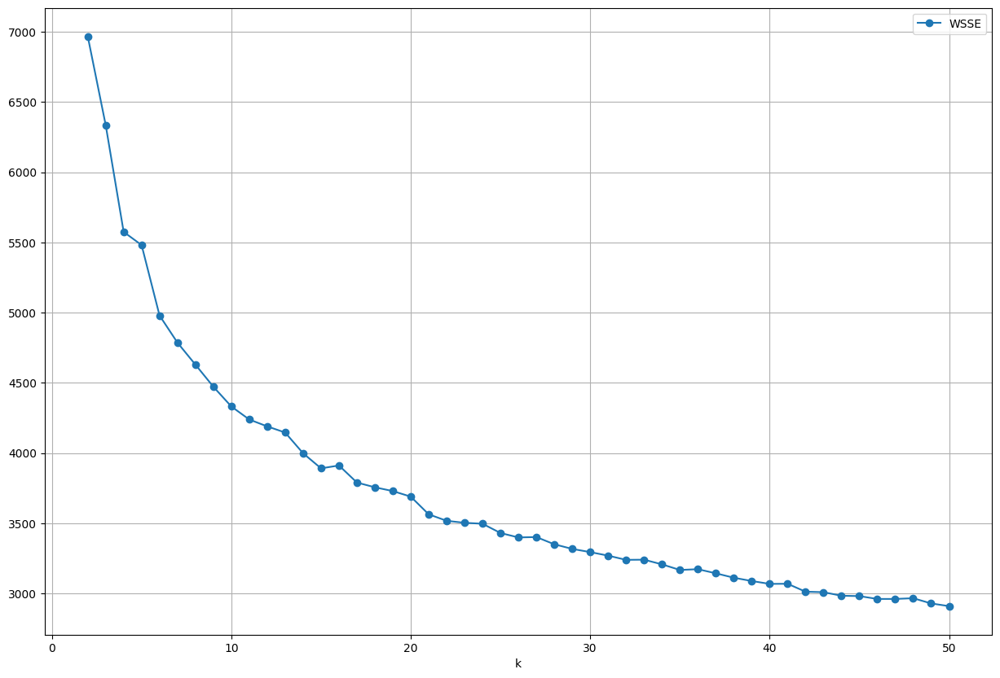

In [43]:
elbow_plot(wsseList, clusters)

## Clustering con el valor de K = 15


In [44]:
scaledDataFeat = dfs_scaled.select("features")
scaledDataFeat.persist()

DataFrame[features: vector]

In [45]:
kmeans = KM(k= 15, seed=1)
model = kmeans.fit(scaledDataFeat)
transformed = model.transform(scaledDataFeat)

### Centroides para el clustering

In [46]:
centers = model.clusterCenters()
centers

[array([-0.2506872 ,  0.90274565, -1.31219646, -0.57801503, -1.17480495,
        -0.5938068 , -0.60443777]),
 array([ 0.04241774, -0.78445643, -1.21933807, -0.55240738, -1.07218561,
        -0.56876841,  0.9170701 ]),
 array([ 0.46043571, -0.9265551 ,  1.28402013, -0.56089798,  1.56166875,
        -0.4992896 ,  0.8711656 ]),
 array([-0.0268738 ,  0.89406979,  0.44275413,  0.79557912,  0.55047344,
         0.73183487, -0.29890302]),
 array([-0.72252536, -1.33661817,  0.40451818,  0.62859539,  0.50416229,
         0.61104601,  1.4410914 ]),
 array([-0.45373195,  0.80865736,  0.18621077, -0.71169677,  0.37276781,
        -0.72288749, -0.36649143]),
 array([-0.24347563, -1.0068653 ,  0.28918921, -0.59210342,  0.37560631,
        -0.59794152,  1.31286316]),
 array([ 0.09224432,  0.97925465,  1.40248022, -0.62550865,  1.6662318 ,
        -0.57628189, -0.78990941]),
 array([-1.21154263, -0.78995457,  0.45301809,  2.0268347 ,  0.54281164,
         1.98483471,  0.83639675]),
 array([ 1.22485811

## A Pandas DF

In [48]:
df = pd_centers(featuresUsed, centers)

## Grafico en paralelo

### Todos los Cluster

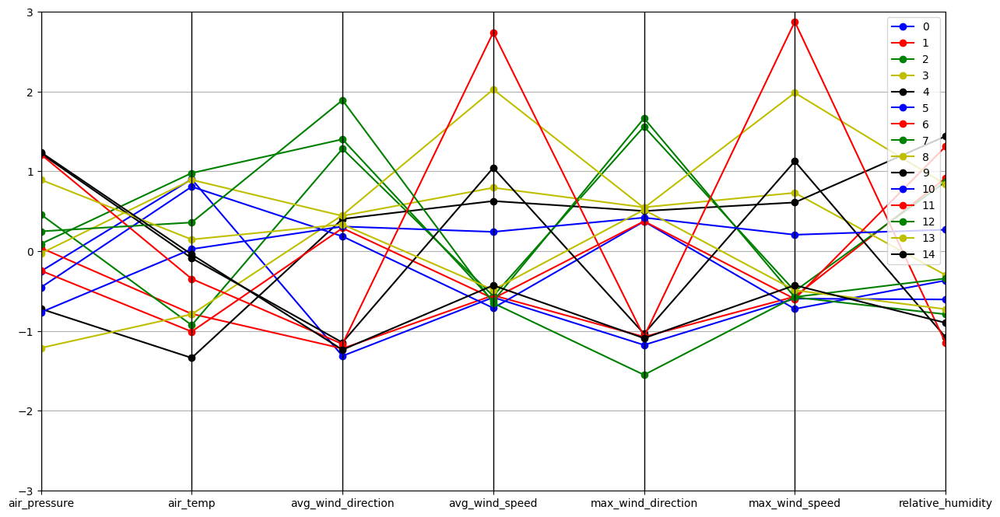

In [49]:
parallel_plot(df, df)

### Dias secos

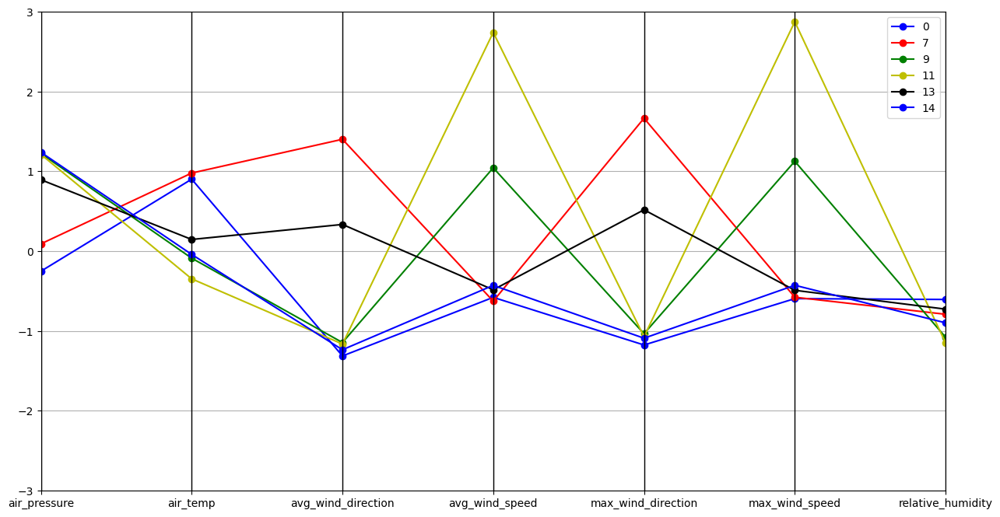

In [50]:
parallel_plot(df[df['relative_humidity']<-0.5], df)

### Dias calientes

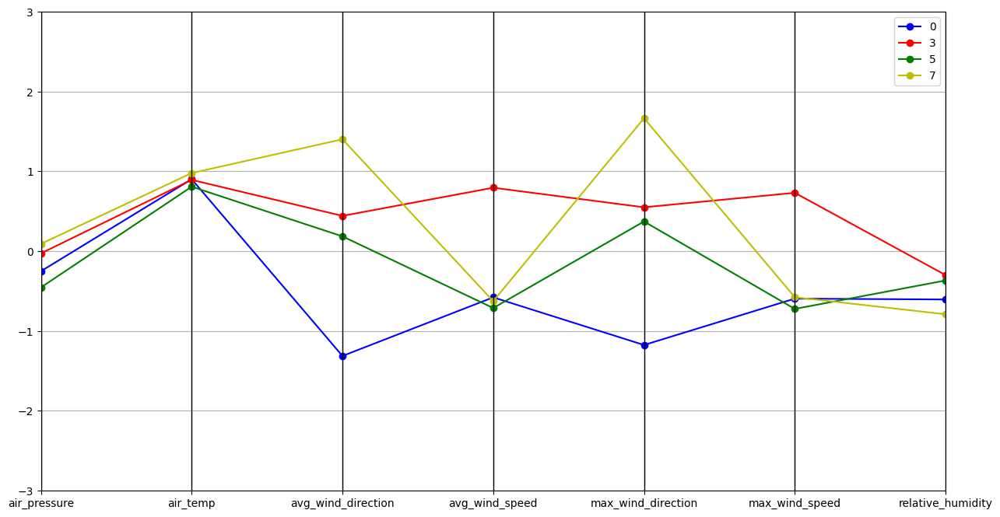

In [51]:
parallel_plot(df[df['air_temp']>0.5], df)

### Dias frios y humedos

In [53]:
parallel_plot(df[(df['relative_humidity']>0.5]) & (df['air_temp']<0.5)], df)

TypeError: ignored

## Regresion Lineal


In [ ]:
from pyspark.ml.regression import LinearRegression


In [ ]:
regr = LinearRegression(labelCol="duration")
regr = regr.fit(flyTrain)

In [ ]:
predictions = regr.transform(flyTest)

predictions['duration', 'prediction'].show()
#['label', 'prediction', 'probability']

+--------+------------------+
|duration|        prediction|
+--------+------------------+
|     385|  366.561868636613|
|     325|355.08390473828297|
|     135|150.90142205430467|
|     310| 317.6808116176087|
|     130| 134.8531856229321|
|     150|153.98936519130487|
|     135|130.71573679202692|
|     125|125.86826355723642|
|     285| 266.2809715601529|
|     205|210.50730082305492|
|     104| 120.5234827606003|
|      80| 80.36443654659824|
|     250|227.56226093179066|
|     255| 232.3922508206837|
|     280|264.24500126662053|
|      70| 73.82833153156453|
|     205| 194.7824853696349|
|     125| 129.0390553738238|
|      70| 77.96578036246969|
|      70| 78.12739547175045|
+--------+------------------+
only showing top 20 rows



## Metricas de Evaluacion



In [ ]:
from pyspark.ml.evaluation import RegressionEvaluator

### RMSE

In [ ]:
RegressionEvaluator(labelCol="duration").evaluate(predictions)

10.906066601140216

### R^2

In [ ]:
RegressionEvaluator(labelCol="duration", metricName= "r2").evaluate(predictions)

0.9843545897654332

Coeficientes

In [ ]:
regr.coefficients

DenseVector([0.0744, 27.1168, 20.0542, 52.0668, 46.0914, 15.1708, 17.3132, 17.5607, -15.0363, -0.2504, 3.9295, 6.8911, 4.622, 8.7595, 8.9211, -0.0565, -0.0965, -0.1466, -0.0775, -0.0253, -0.0367, -1.8358, -1.9439, -2.0399, -3.4252, -4.0351, -3.9022, -3.978, -3.9971, -3.8898, -2.5948, -0.4182])

## LASSO

In [ ]:
lasso = LinearRegression(labelCol="duration", elasticNetParam= 1, regParam = 0.01)
lasso = lasso.fit(flyTrain)

In [ ]:
predictionsLasso = lasso.transform(flyTest)

predictionsLasso['duration', 'prediction'].show()
#['label', 'prediction', 'probability']

+--------+------------------+
|duration|        prediction|
+--------+------------------+
|     385| 366.5511697973193|
|     325| 355.3035062141946|
|     135|  150.930811519023|
|     310|318.73897535119204|
|     130|134.88573294134096|
|     150|153.99532050154193|
|     135|130.74077325994116|
|     125|126.10128193938766|
|     285|266.29683951517836|
|     205|210.51585376203218|
|     104|120.56045851045715|
|      80| 80.38473444092459|
|     250| 227.5659939700428|
|     255|232.38116985078292|
|     280| 264.2612698448754|
|      70| 73.86456188382968|
|     205|  194.812422269834|
|     125| 129.0644217667505|
|      70| 78.00952156522946|
|      70| 78.17271361120774|
+--------+------------------+
only showing top 20 rows



RMSE

In [ ]:
RegressionEvaluator(labelCol="duration").evaluate(predictionsLasso)

10.908131871740867

R^2

In [ ]:
RegressionEvaluator(labelCol="duration", metricName= "r2").evaluate(predictionsLasso)

0.9843486636939319

Coeficientes

In [ ]:
lasso.coefficients

DenseVector([0.0744, 26.0499, 18.9657, 50.9882, 44.9963, 14.0681, 16.2105, 16.4367, -14.8485, -0.246, 3.6892, 6.6455, 4.3594, 8.5044, 8.6676, 0.0, -0.0094, -0.0631, 0.0, 0.0, 0.0, -1.4444, -1.5514, -1.639, -3.0242, -3.6278, -3.5063, -3.5882, -3.602, -3.4874, -2.1959, -0.0205])

## RIDGE

In [ ]:
ridge = LinearRegression(labelCol="duration", elasticNetParam = 0, regParam= 0.01)
ridge = ridge.fit(flyTrain)

In [ ]:
predictionsRidge = regr.transform(flyTest)

predictionsRidge['duration', 'prediction'].show()
#['label', 'prediction', 'probability']

+--------+------------------+
|duration|        prediction|
+--------+------------------+
|     385|  366.561868636613|
|     325|355.08390473828297|
|     135|150.90142205430467|
|     310| 317.6808116176087|
|     130| 134.8531856229321|
|     150|153.98936519130487|
|     135|130.71573679202692|
|     125|125.86826355723642|
|     285| 266.2809715601529|
|     205|210.50730082305492|
|     104| 120.5234827606003|
|      80| 80.36443654659824|
|     250|227.56226093179066|
|     255| 232.3922508206837|
|     280|264.24500126662053|
|      70| 73.82833153156453|
|     205| 194.7824853696349|
|     125| 129.0390553738238|
|      70| 77.96578036246969|
|      70| 78.12739547175045|
+--------+------------------+
only showing top 20 rows



RMSE

In [ ]:
RegressionEvaluator(labelCol="duration").evaluate(predictionsRidge)

10.906066601140216

R^2

In [ ]:
RegressionEvaluator(labelCol="duration", metricName= "r2").evaluate(predictionsRidge)

0.9843545897654332

Coeficientes

In [ ]:
ridge.coefficients

DenseVector([0.0744, 26.981, 19.9196, 51.9328, 45.9513, 15.0315, 17.1744, 17.4217, -15.0226, -0.251, 3.9285, 6.8891, 4.6165, 8.7546, 8.9169, -0.0557, -0.0955, -0.1457, -0.0766, -0.0245, -0.0363, -1.8322, -1.9404, -2.0349, -3.42, -4.0297, -3.8968, -3.9737, -3.9927, -3.8855, -2.5914, -0.4155])

## Análisis del modelo

Los tres modelos en si, hasta su cuarto lugar decimal no tienen diferencia en cuanto a R^2. RIDGE y el modelo estándar tienen prácticamente ninguna diferencia, con LASSO teniendo el menor R^2 con 0.984349 (los otros modelos tienen 0.984354). En cuanto al RMSE se observa resultados similares, con RIDGE y el modelo estandar con el mismo valor de 10.9061 y LASSO con un error mayor en 0.0019. El factor que diferencia a los tres modelos, es su complejidad, como RIDGE mantuvo todas las variables que estaban presentes en el modelo estándar, no cambio de la complejidad original, pero LASSO eliminó a 4 variables y rebajó el peso del resto de una manera mucho más notable que RIDGE.

Por lo cual, aunque el rendimiento de los tres modelos es bastante similar, se decide tomar el modelo ejecutado con LASSO por su menor complejidad.

In [ ]:
spark.stop()